# SQL Injection Classification

The following notebook contains the code used for exploratotry data analysis and model building for our SQL injection detection model. The dataset used is the [SQL Injection Detection](https://www.kaggle.com/datasets/gambleryu/biggest-sql-injection-dataset) dataset from Kaggle. The dataset contains 148326 rows of data with 2 columns, one for the SQL query and the other for the label. The label is binary, with 1 indicating that the query is a SQL injection and 0 indicating that the query is not a SQL injection.`

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [3]:
raw_df = pd.read_csv('clean_sql_dataset.csv')

In [4]:
raw_df

,Query,Label
0,""" or pg_sleep ( __TIME__ ) --",1
1,create user name identified by pass123 tempora...,1
2,AND 1 = utl_inaddr.get_host_address ( ...,1
3,select * from users where id = '1' or @ @1 ...,1
4,"select * from users where id = 1 or 1#"" ( ...",1
...,...,...
148321,5555555555555555555555555555555555555555555555...,0
148322,0521094088709893969415119606172279713007042396...,0
148323,,0
148324,"""or 1=1",1


In [5]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 148326 entries, 0 to 148325
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   Query   148326 non-null  object
 1   Label   148326 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 2.3+ MB


Might be worth it to try and find the count of each target string in the dataset to see if there are any noticable correlations between the target count and the query.
Some SQLi queries use a lot of `char (` and `chr (` functions.

In [7]:
labeled_df = raw_df.copy()
labeled_df['contains_AND'] = labeled_df['Query'].str.contains('AND', case=False, na=False).astype(int)
labeled_df['contains_OR'] = labeled_df['Query'].str.contains('OR', case=False, na=False).astype(int)
labeled_df['contains_EQUAL'] = labeled_df['Query'].str.contains('=', case=False, na=False).astype(int)
labeled_df['contains_SEMICOLON'] = labeled_df['Query'].str.contains(';', case=False, na=False).astype(int)
labeled_df['contains_UNION'] = labeled_df['Query'].str.contains('UNION', case=False, na=False).astype(int)
labeled_df['contains_AT'] = labeled_df['Query'].str.contains('@', case=False, na=False).astype(int)
labeled_df['count_AT'] = labeled_df['Query'].str.count('@').fillna(0).astype(int)
labeled_df['contains_SELECT'] = labeled_df['Query'].str.contains('SELECT', case=False, na=False).astype(int)
labeled_df['contains_INSERT'] = labeled_df['Query'].str.contains('INSERT', case=False, na=False).astype(int)
labeled_df['contains_UPDATE'] = labeled_df['Query'].str.contains('UPDATE', case=False, na=False).astype(int)
labeled_df['contains_DELETE'] = labeled_df['Query'].str.contains('DELETE', case=False, na=False).astype(int)
labeled_df['contains_ASTERISK'] = labeled_df['Query'].str.contains('\*', case=False, na=False).astype(int)
labeled_df['contains_CONCAT'] = labeled_df['Query'].str.contains('CONCAT', case=False, na=False).astype(int)
labeled_df['contains_SLEEP'] = labeled_df['Query'].str.contains('SLEEP', case=False, na=False).astype(int)
labeled_df['contains_NULL'] = labeled_df['Query'].str.contains('NULL', case=False, na=False).astype(int)
labeled_df['contains_CHAR'] = labeled_df['Query'].str.contains('char\s*\(', case=False, na=False).astype(int)
labeled_df['count_CHAR'] = labeled_df['Query'].str.count('char\s*\(').fillna(0).astype(int)
labeled_df['contains_CHR'] = labeled_df['Query'].str.contains('chr\s*\(', case=False, na=False).astype(int)
labeled_df['count_CHR'] = labeled_df['Query'].str.count('chr\s*\(').fillna(0).astype(int)
labeled_df['length'] = labeled_df['Query'].str.len()

<>:13: SyntaxWarning: invalid escape sequence '\*'
<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:18: SyntaxWarning: invalid escape sequence '\s'
<>:19: SyntaxWarning: invalid escape sequence '\s'
<>:20: SyntaxWarning: invalid escape sequence '\s'
<>:13: SyntaxWarning: invalid escape sequence '\*'
<>:17: SyntaxWarning: invalid escape sequence '\s'
<>:18: SyntaxWarning: invalid escape sequence '\s'
<>:19: SyntaxWarning: invalid escape sequence '\s'
<>:20: SyntaxWarning: invalid escape sequence '\s'
C:\Users\A0\AppData\Local\Temp\ipykernel_21456\1311213006.py:13: SyntaxWarning: invalid escape sequence '\*'
  labeled_df['contains_ASTERISK'] = labeled_df['Query'].str.contains('\*', case=False, na=False).astype(int)
C:\Users\A0\AppData\Local\Temp\ipykernel_21456\1311213006.py:17: SyntaxWarning: invalid escape sequence '\s'
  labeled_df['contains_CHAR'] = labeled_df['Query'].str.contains('char\s*\(', case=False, na=False).astype(int)
C:\Users\A0\AppData\Local\Temp\ipykernel_21456\1311

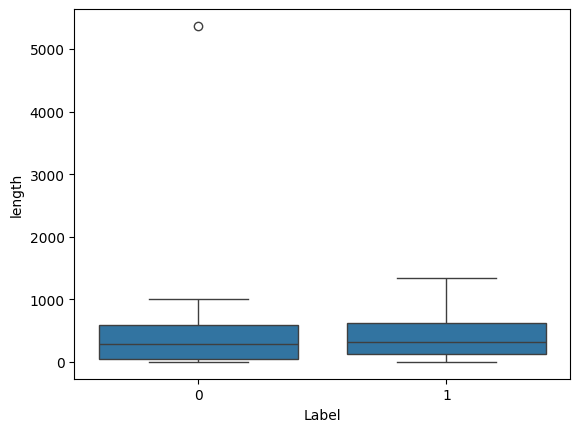

In [9]:
sns.boxplot(x='Label', y='length', data=labeled_df)
plt.show()

In [10]:
px.histogram(labeled_df, x='length', color='Label', marginal='box')

Observed the presence of some length outlier queries. Lets see what happens if we remove them.

In [11]:
lengthq1 = labeled_df['length'].quantile(0.25)
lengthq3 = labeled_df['length'].quantile(0.75)
lengthiqr = lengthq3 - lengthq1
outlier_high = lengthq3 + 1.5 * lengthiqr
outlier_low = lengthq1 - 1.5 * lengthiqr
filtered_df = labeled_df[(labeled_df['length'] > outlier_low) & (labeled_df['length'] < outlier_high)]
filtered_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 148325 entries, 0 to 148325
Data columns (total 22 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   Query               148325 non-null  object
 1   Label               148325 non-null  int64 
 2   contains_AND        148325 non-null  int64 
 3   contains_OR         148325 non-null  int64 
 4   contains_EQUAL      148325 non-null  int64 
 5   contains_SEMICOLON  148325 non-null  int64 
 6   contains_UNION      148325 non-null  int64 
 7   contains_AT         148325 non-null  int64 
 8   count_AT            148325 non-null  int64 
 9   contains_SELECT     148325 non-null  int64 
 10  contains_INSERT     148325 non-null  int64 
 11  contains_UPDATE     148325 non-null  int64 
 12  contains_DELETE     148325 non-null  int64 
 13  contains_ASTERISK   148325 non-null  int64 
 14  contains_CONCAT     148325 non-null  int64 
 15  contains_SLEEP      148325 non-null  int64 
 16  contain

Resulted in only 1 value being cut. Lets re run the graphs and see if there is any change.

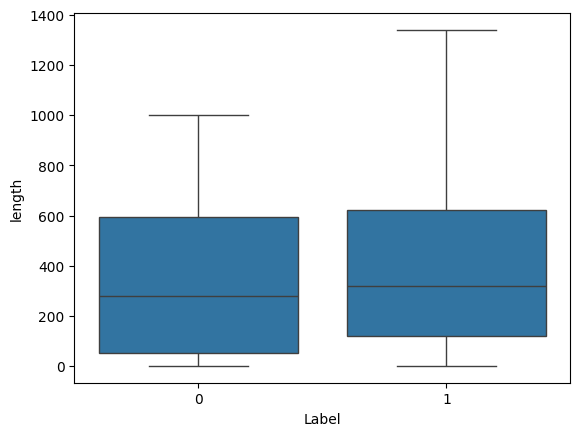

In [13]:
sns.boxplot(x='Label', y='length', data=filtered_df)
plt.show()

In [14]:
px.histogram(filtered_df, x='length', color='Label', marginal='box')

In general it appears that the length of a query is a slight indication of whetehr it is a SQLi query or not.

In [18]:
px.histogram(filtered_df, x='count_AT', color='Label', marginal='box')

Scale numerical data

In [35]:
filtered_df.describe()
#type(filtered_df)

,Label,contains_AND,contains_OR,contains_EQUAL,contains_SEMICOLON,contains_UNION,contains_AT,count_AT,contains_SELECT,contains_INSERT,...,contains_DELETE,contains_ASTERISK,contains_CONCAT,contains_SLEEP,contains_NULL,contains_CHAR,count_CHAR,contains_CHR,count_CHR,length
count,148325.000000,148325.000000,148325.000000,148325.000000,148325.000000,148325.000000,148325.000000,148325.000000,148325.000000,148325.000000,...,148325.000000,148325.000000,148325.000000,148325.000000,148325.000000,148325.000000,148325.000000,148325.000000,148325.000000,148325.000000
mean,0.524187,0.561092,0.574859,0.450612,0.140347,0.101763,0.103826,0.549085,0.420361,0.002157,...,0.001868,0.296909,0.040721,0.058594,0.067811,0.036723,0.229402,0.034135,0.268559,364.461015
std,0.499416,0.496255,0.494366,0.497557,0.347348,0.302337,0.305036,2.160489,0.493619,0.046398,...,0.043175,0.456898,0.197645,0.234865,0.251421,0.188083,1.391303,0.181575,1.594912,295.100588
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,85.000000
50%,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,302.000000
75%,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,609.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,28.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,12.000000,1.000000,13.000000,1340.000000


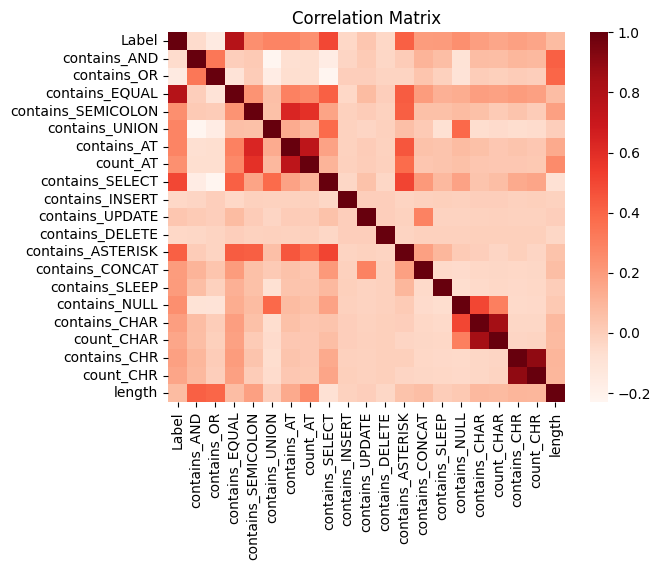

In [22]:
sns.heatmap(filtered_df.corr(numeric_only=True), cmap='Reds')
plt.title('Correlation Matrix');

In [23]:
from sklearn.preprocessing import MinMaxScaler

In [25]:
scaler = MinMaxScaler()
scaler.fit(filtered_df.iloc[:, 1:])

MinMaxScaler()

In [26]:
print('Minimum:')
list(scaler.data_min_)

Minimum:


[np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(0.0),
 np.float64(1.0)]

In [27]:
print('Maximum:')
list(scaler.data_max_)

Maximum:


[np.float64(1.0),
 np.float64(1.0),
 np.float64(1.0),
 np.float64(1.0),
 np.float64(1.0),
 np.float64(1.0),
 np.float64(1.0),
 np.float64(28.0),
 np.float64(1.0),
 np.float64(1.0),
 np.float64(1.0),
 np.float64(1.0),
 np.float64(1.0),
 np.float64(1.0),
 np.float64(1.0),
 np.float64(1.0),
 np.float64(1.0),
 np.float64(12.0),
 np.float64(1.0),
 np.float64(13.0),
 np.float64(1340.0)]

In [42]:
scaled_df = filtered_df.iloc[:, 1:]
type(scaled_df)
scaled_df = scaler.transform(scaled_df)
# Need to do this without affecting the label and query columns.
# need to convert the numpy array to a DataFrame by preserving the numerical column names, setting the array to the new Dataframe and setting the column names to the original column names. Then add the Query and Label columns back to the DataFrame.


numpy.ndarray